In [93]:
import os
import matplotlib.pyplot as plt
import matplotlib.ticker as tck
import pandas as pd

import sys

# Path to library directory.
_lib_path = os.path.join('c:' + os.sep, 'Users', 'natha', 'OneDrive', 'Documents', 'GitHub', 'Debiasing_Kepler_Data', 'lib')

# Allows access to modules in the library directory.
if _lib_path not in sys.path:
    sys.path.append(_lib_path)

import system_names
import index_combinations

In [94]:
SAVE_PLOTS = True
SHOW_PLOTS = True

In [95]:
def plot_mutual_inclinations(aligned_system_filepath, random_system_filepath):
    '''
    Plots the mutual inclination data.
    '''

    # Validates the input.
    if type(aligned_system_filepath) != str or type(random_system_filepath) != str:
        raise Exception('Please input the filepaths as a string! A filepath was not a string.')

    # Reads in the data as a pandas data frame.
    aligned_data = pd.read_csv(aligned_system_filepath)
    random_data = pd.read_csv(random_system_filepath)

    # Ensures the data files are in parallel.
    assert len(aligned_data.columns) == len(random_data.columns)

    # Gets the multiplicity from the final column.
    multiplicity = int(aligned_data.columns[-1].split(' ')[3])

    # Calculates the number of rows and columns required for the figure.
    plot_rows = multiplicity - 1
    plot_columns = multiplicity - 1

    # Initializes a multi-panel plot.
    (fig, axes) = plt.subplots(plot_rows, plot_columns, sharex = True, sharey = True)
    
    # Defines a scale factor.
    INCHES_PER_MULTIPLICTY = 3

    # Defines the figure size by the scale factor.
    figure_size = multiplicity * INCHES_PER_MULTIPLICTY

    # Sets the figure size.
    fig.set_size_inches(figure_size, figure_size)

    xlabels = list()

    color = (1, 0.3, 0.3)
    rcolor = (0.3, 0.3, 1)

    # Loops through each of the planet-planet combinations.
    for (n1, n2) in index_combinations.get_index_combinations(multiplicity):
        # Calculates the planet numbers (adds 1 due to zero indexing).
        p1 = n1 + 1
        p2 = n2 + 1

        # Calculates the plot index based on the given grid values.
        index = p1 + (multiplicity - p2)*(multiplicity - 1)

        # Creates the subplot.
        axis = plt.subplot(plot_rows, plot_columns, index)
        axis.grid(visible = True, alpha = 0.5, axis = 'y')

        if p1 == 1:
            axis.set_ylabel('Planet {p}\n\nMutual Inclination'.format(p = p2) + '$^{\circ}$', fontsize = 15)

        if p2 == multiplicity:
            xlabels.append(p1)

        # Creates a label for the planet pair.
        column_label = 'Planets {planet_1} and {planet_2} mutual inclination'.format(planet_1 = (n1 + 1), planet_2 = (n2 + 1))

        # Gets the data to plot.
        (x, y) = (aligned_data['Time'].astype(float), aligned_data[column_label].astype(float))
        (rx, ry) = (random_data['Time'].astype(float), random_data[column_label].astype(float))

        #mean = y.mean()
        median = y.median()
        #rmean = ry.mean()
        rmedian = ry.median()

        axis.hlines(median, 0, 1e6, color = (0.60, 0.05, 0), linestyles = 'solid')
        #axis.hlines(mean, 0, 1e6, color = (0.75, 0.25, 0), linestyles = 'solid')
        axis.hlines(rmedian, 0, 1e6, color = (0, 0.05, 0.60), linestyles = 'solid')
        #axis.hlines(rmean, 0, 1e6, color = (0, 0.25, 0.75), linestyles = 'solid')

        # Plots the data.
        axis.scatter(x, y, color = color, alpha = 0.2, s = 2)
        axis.scatter(rx, ry, color = rcolor, alpha = 0.2, s = 2)
        
        axis.set_xlim(0, 1e6)

    # Adds the legends.
    axis.plot([], [], color = color, label = 'Aligned $\Omega$')
    axis.plot([], [], color = rcolor, label = 'Random $\Omega$')
    axis.plot([], [], color = (0.25, 0.25, 0.25), label = 'Median', linestyle = 'solid')

    for column in range(len(axes[multiplicity-2])):
        axis = axes[multiplicity-2][column]
#xlabels[column]
        axis.set_xlabel('Time (1 Myr)\n\nPlanet {p}'.format(p = xlabels[column]), fontsize = 15)
        axis.xaxis.set_major_formatter(tck.NullFormatter())
        axis.xaxis.set_major_locator(tck.LinearLocator(10))

    # Turns unused panels black.
    for (n1, n2) in index_combinations.get_index_combinations(multiplicity):
        # Calculates the planet numbers (adds 1 due to zero indexing).
        p1 = n1 + 2
        p2 = n2

        if (p1 - p2) > 0:
            continue

        # Calculates the plot index based on the given grid values.
        index = p2 + (multiplicity - p1)*(multiplicity - 1)

        # Creates the subplot.
        axis = plt.subplot(plot_rows, plot_columns, index)
        axis.set_facecolor('white')

    fig.subplots_adjust(wspace = 0, hspace = 0)
    fig.legend(fontsize = (multiplicity * 4), bbox_to_anchor = (0.91, 0.99))

    system_name = aligned_system_filepath.split(os.sep)[-1].replace('.csv', '')

    #fig.tight_layout()
    fig.suptitle('Mutual Inclinations vs. Time\n({system})'.format(system = system_name), fontsize = 7 * multiplicity, verticalalignment = 'top')

    if SAVE_PLOTS:
        savepath = os.path.join(os.pardir, os.pardir, 'results', 'mutual_inclinations', system_name)

        fig.savefig(savepath, bbox_inches = 'tight', dpi = 300)

    if SHOW_PLOTS:
        plt.show()

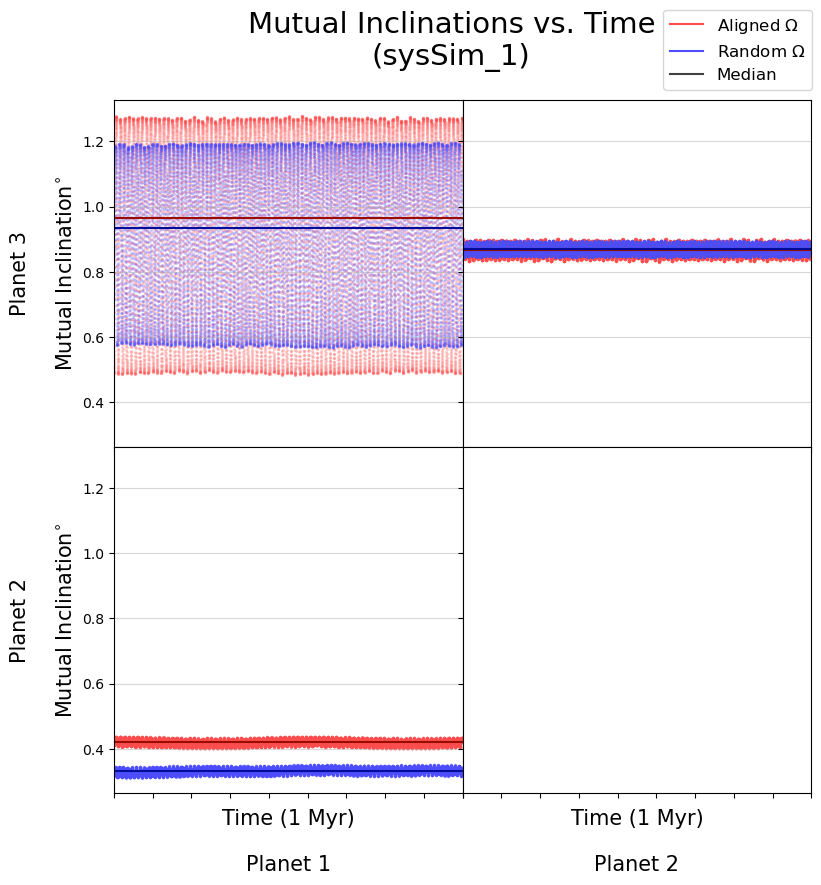

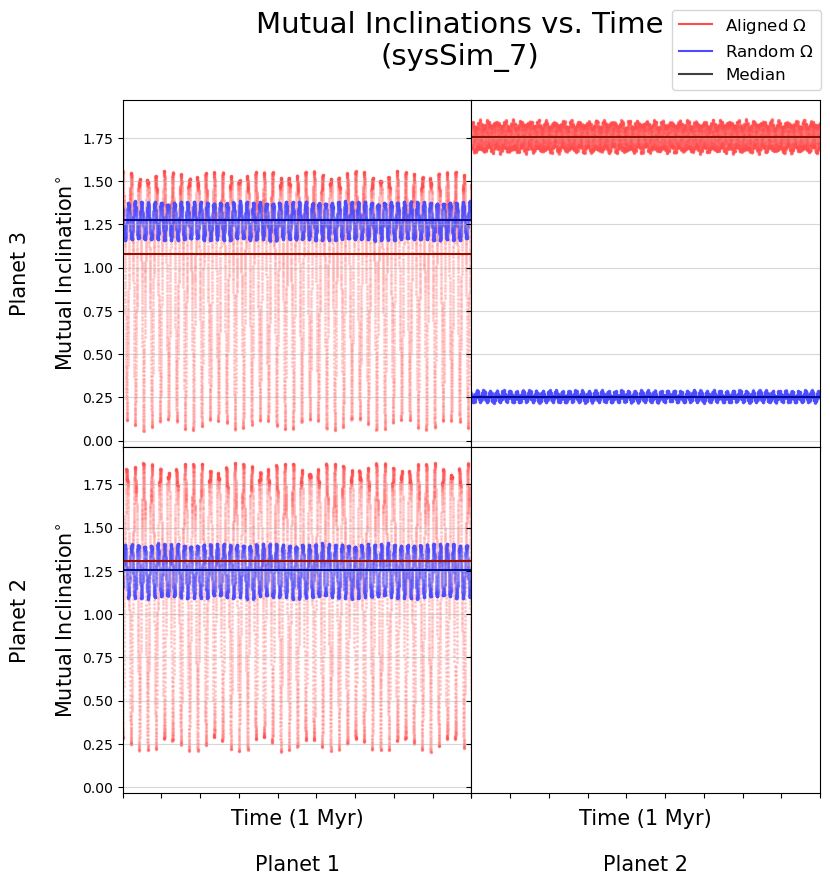

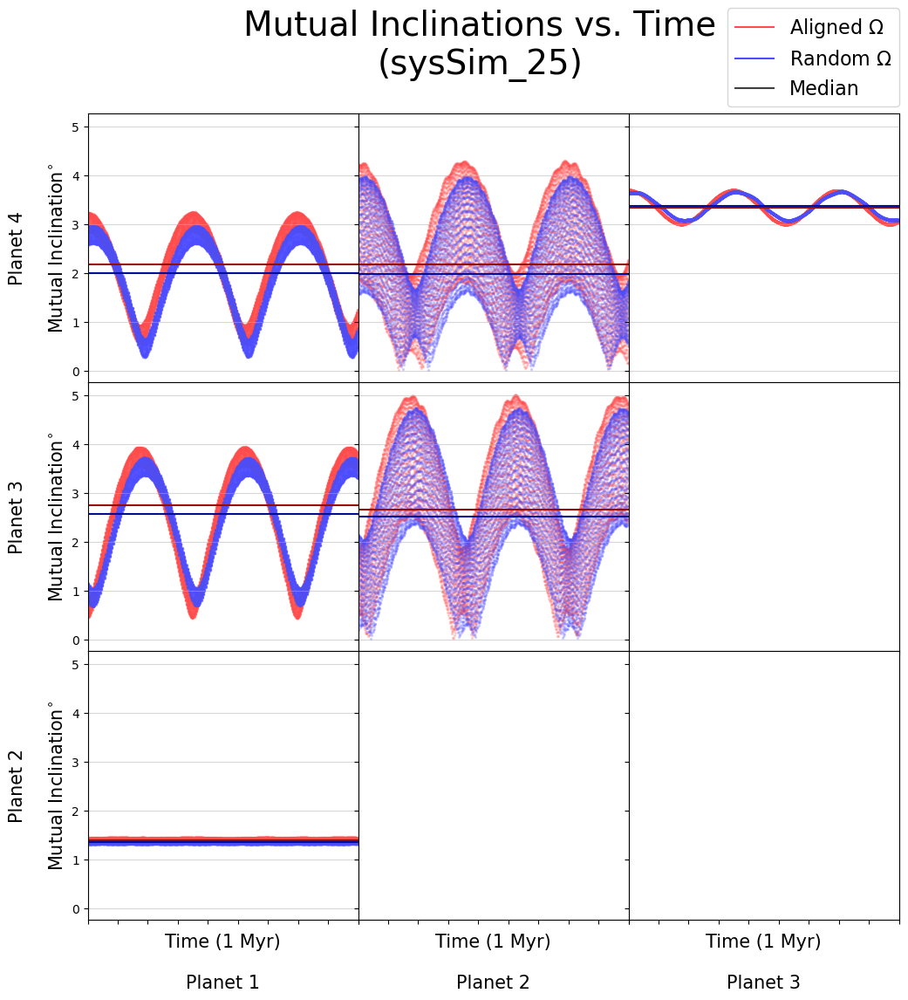

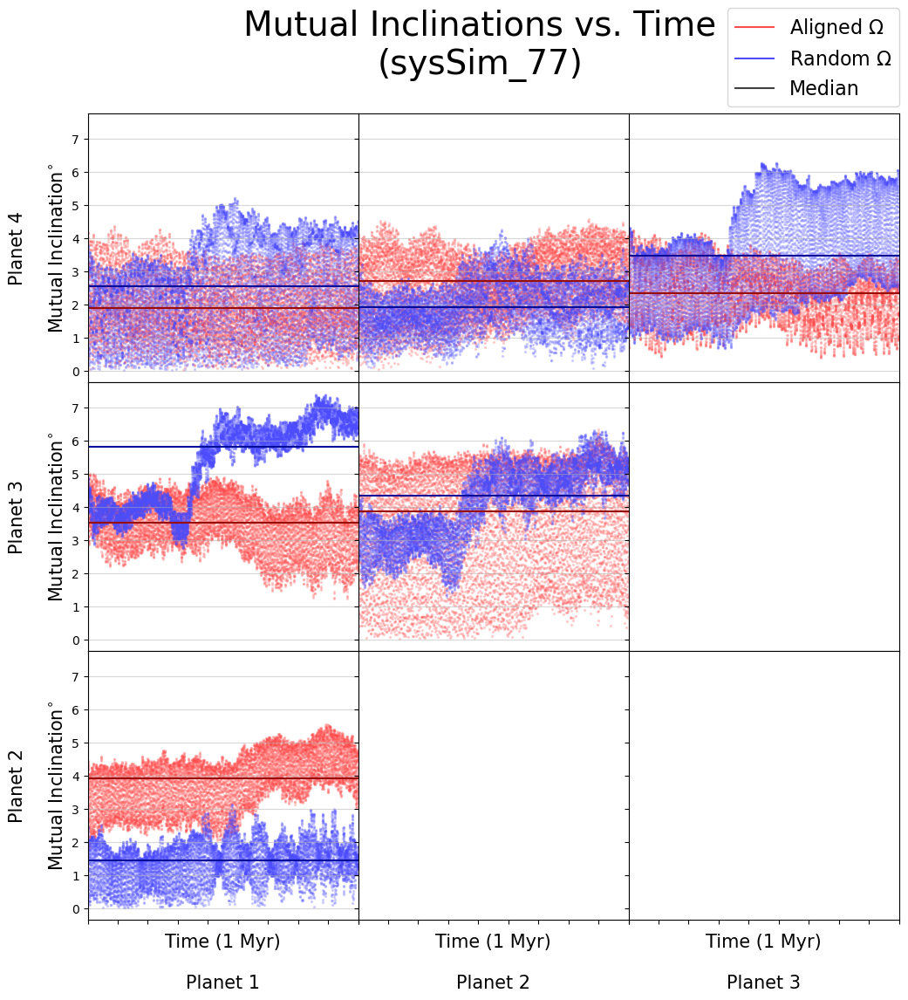

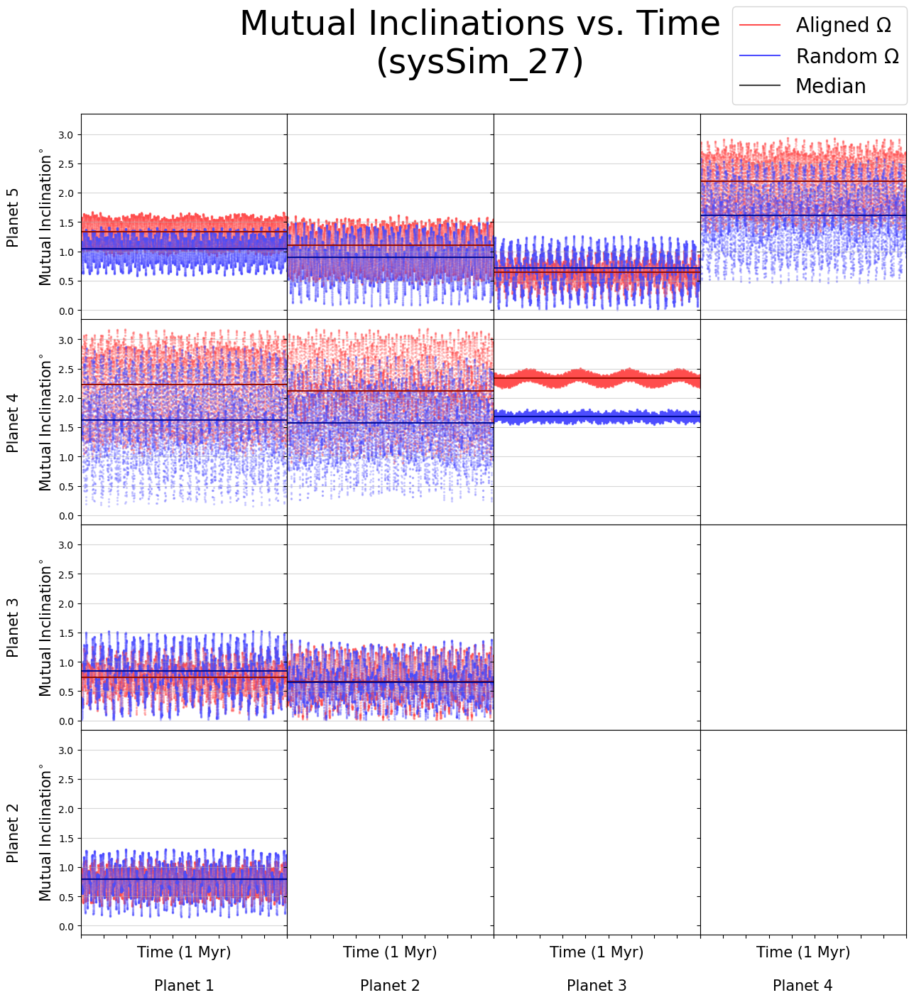

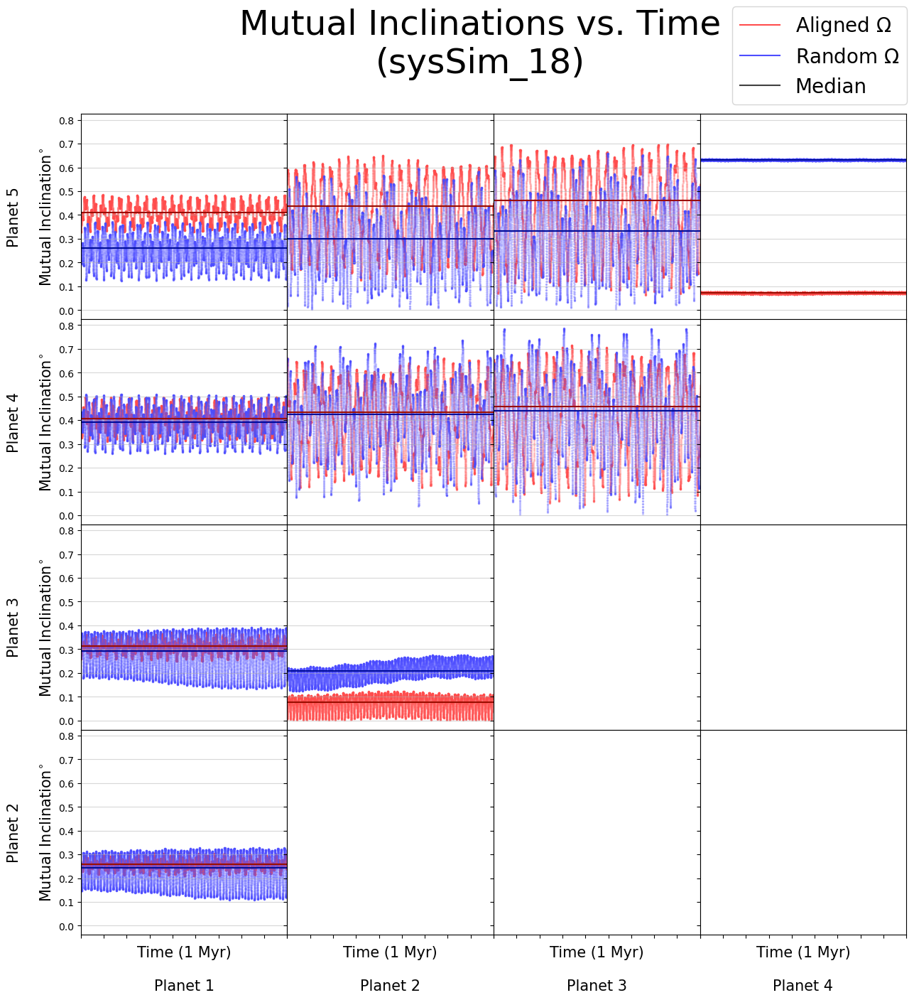

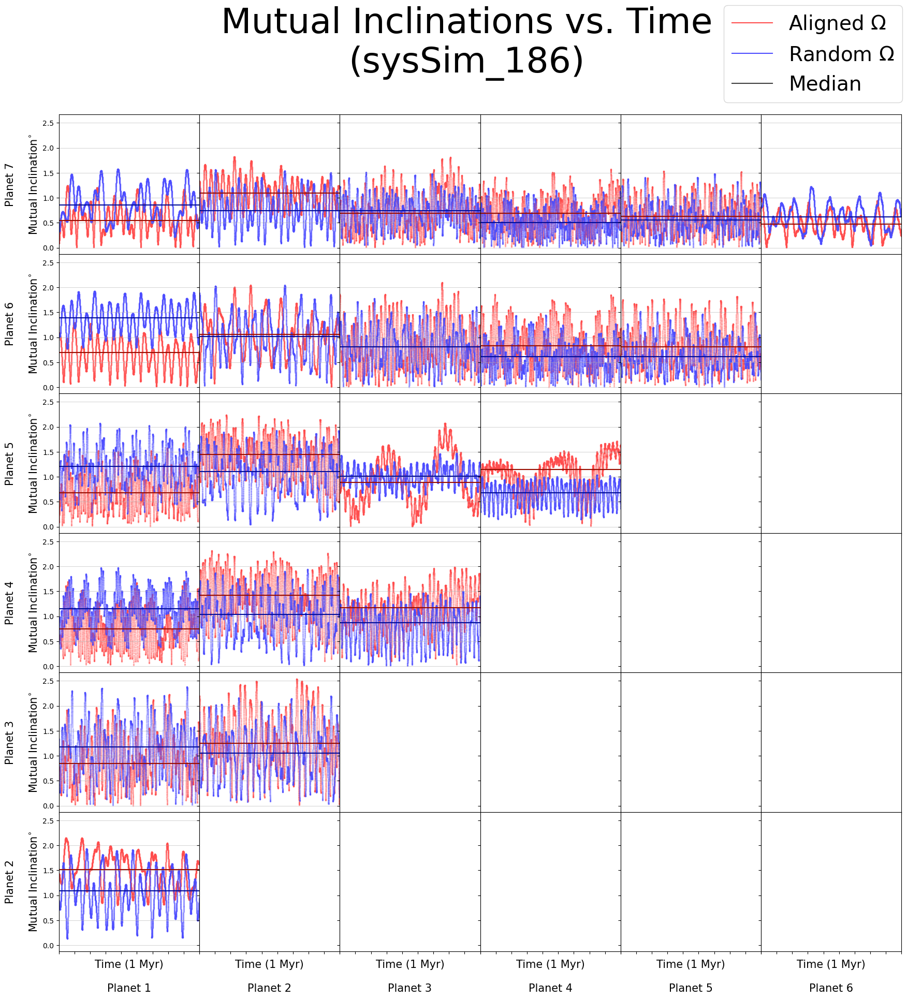

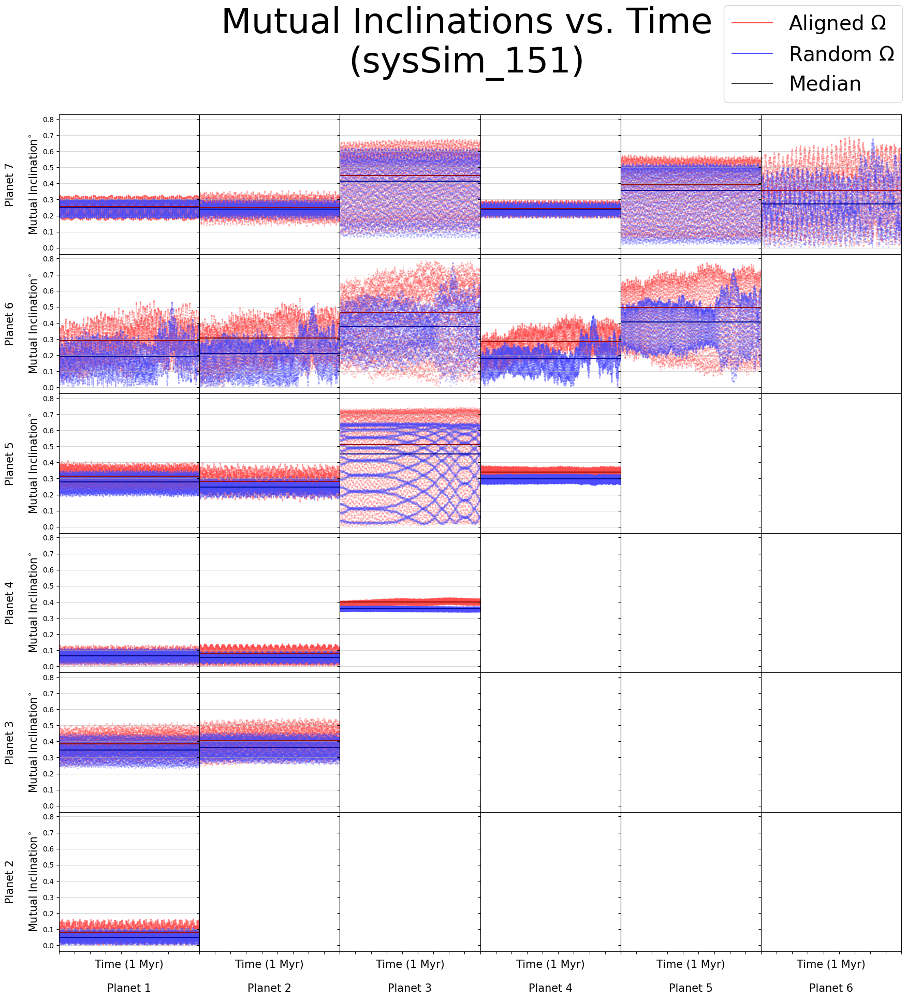

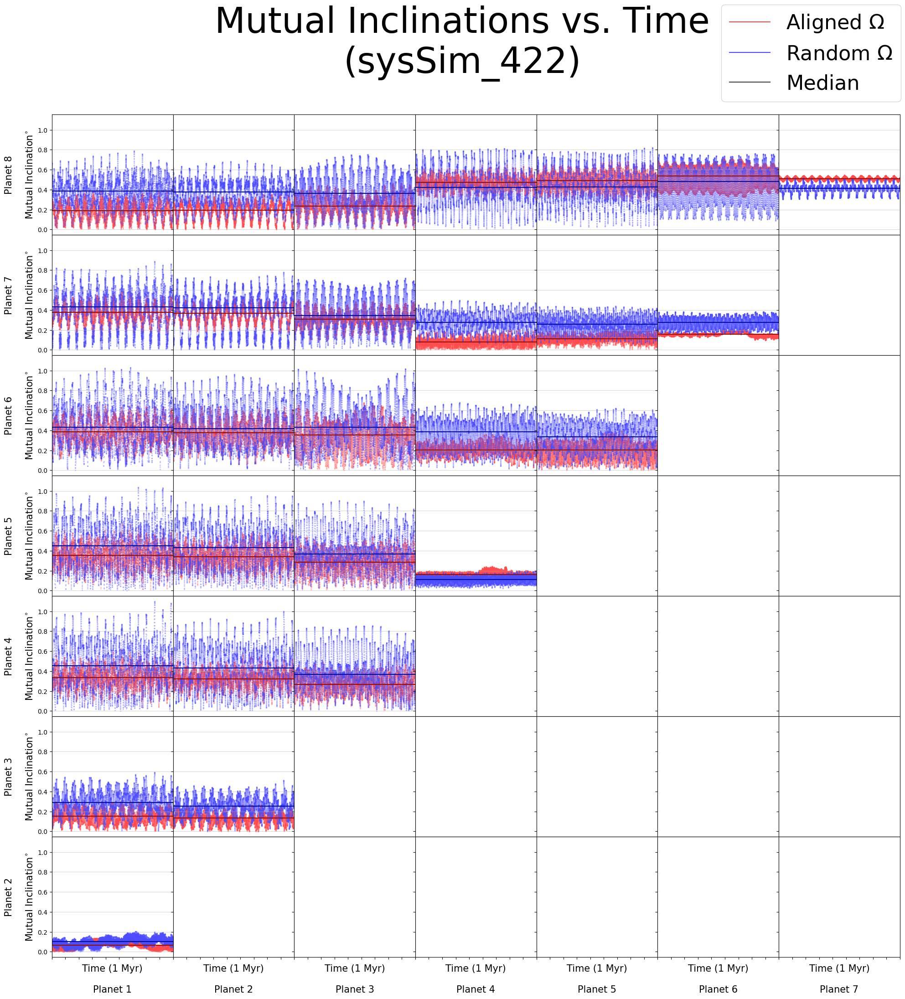

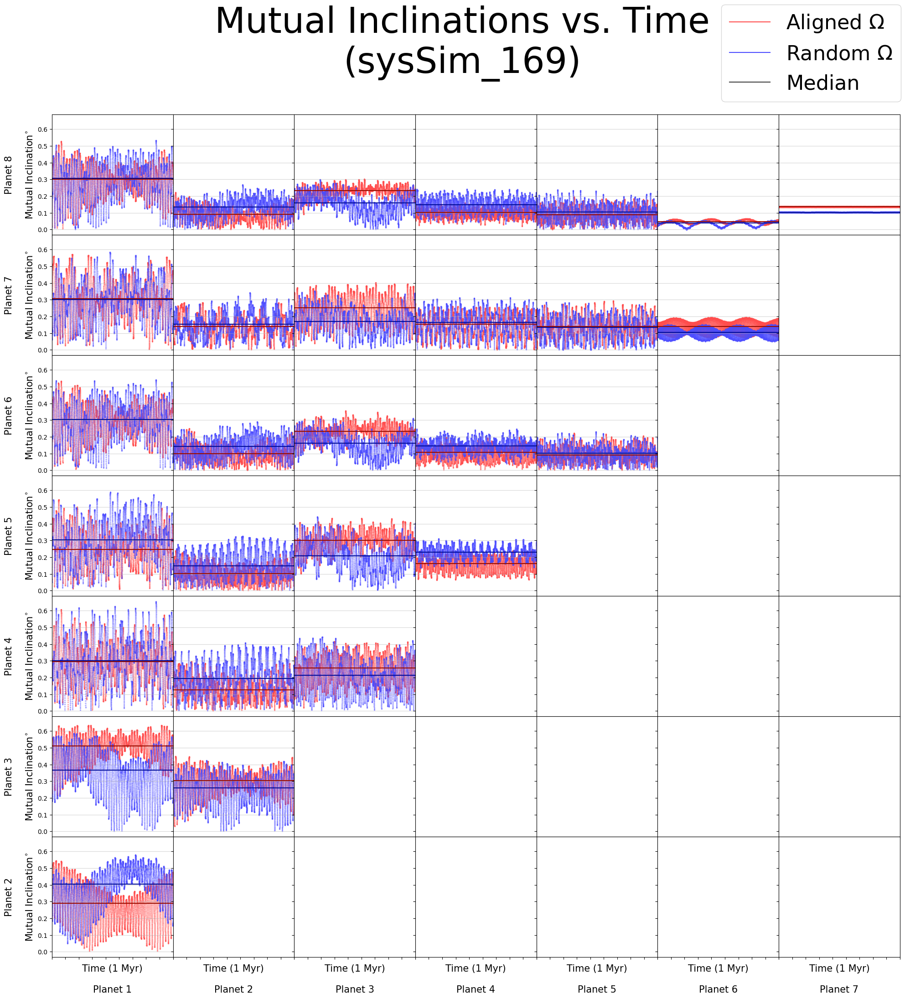

In [96]:
system_names = [
    ('sysSim_1.csv', 'sysSim_1_randomO.csv'), # 1
    ('sysSim_7.csv', 'sysSim_7_randomO.csv'), # 2
    ('sysSim_25.csv', 'sysSim_25_randomO.csv'), # 3
    ('sysSim_77.csv', 'sysSim_77_randomO.csv'), # 4
    ('sysSim_27.csv', 'sysSim_27_randomO.csv'), # 5
    ('sysSim_18.csv', 'sysSim_18_randomO.csv'), # 6
    ('sysSim_186.csv', 'sysSim_186_randomO.csv'), # 7
    ('sysSim_151.csv', 'sysSim_151_randomO.csv'), # 8
    ('sysSim_422.csv', 'sysSim_422_randomO.csv'), # 9
    ('sysSim_169.csv', 'sysSim_169_randomO.csv'), # 10
]

for (aligned, random) in system_names:
    aligned_path = os.path.join(os.pardir, os.pardir, 'data', 'processed', 'mutual_inclinations', aligned)
    random_path = os.path.join(os.pardir, os.pardir, 'data', 'processed', 'mutual_inclinations', random) 

    plot_mutual_inclinations(aligned_path, random_path)